# Programming Project #1: Hybrid Images

## CS445: Computational Photography

### Part I: Hybrid Images

In [54]:
import cv2

import numpy as np
from matplotlib.colors import LogNorm
from scipy import signal

datadir = "./" 

utilfn = datadir + "utils.py"
!cp "$utilfn" .
import utils

cp: ./utils.py and ./utils.py are identical (not copied).


In [55]:
# switch from notebook to inline if using colab or otherwise cannot use interactive display)
%matplotlib notebook  
import matplotlib.pyplot as plt

In [117]:
im1_file = datadir + 'wolf.jpeg'
im2_file = datadir + 'jobs.png'

im1 = np.float32(cv2.imread(im1_file, cv2.IMREAD_GRAYSCALE) / 255.0)
im2 = np.float32(cv2.imread(im2_file, cv2.IMREAD_GRAYSCALE) / 255.0)

TypeError: unsupported operand type(s) for /: 'NoneType' and 'float'

<IPython.core.display.Javascript object>


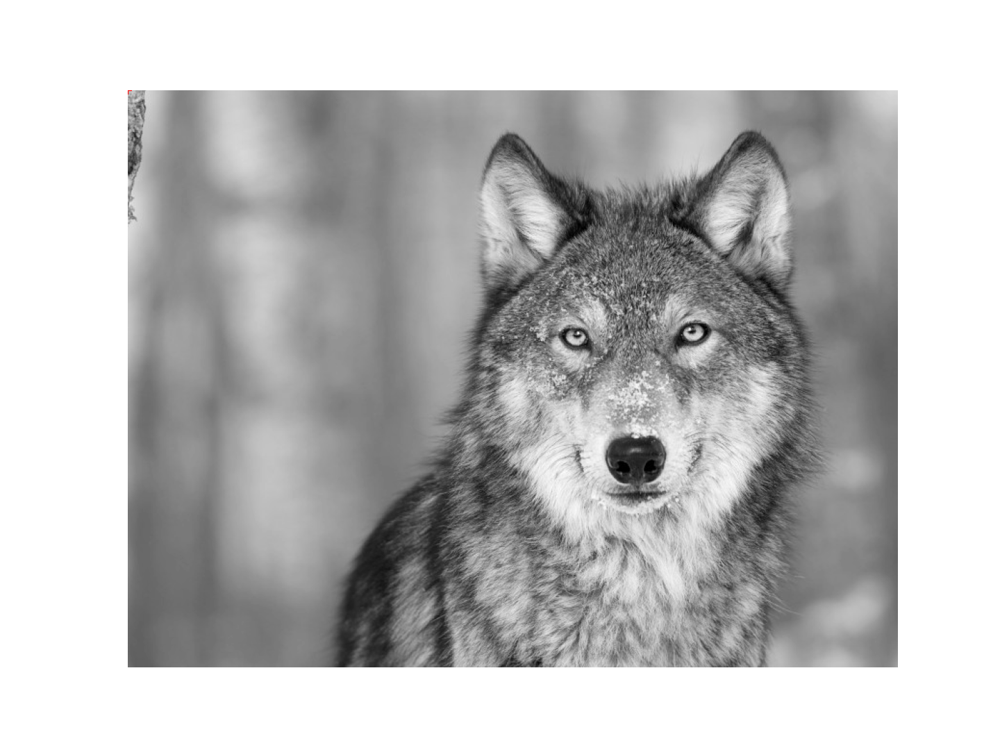

In [116]:
pts_im1 = utils.prompt_eye_selection(im1)
# pts_im1 = np.array([[607, 290], [748, 370]]) # uncomment if entering [x, y] pts manually
plt.plot(pts_im1[:,0], pts_im1[:,1], 'r-+')

Image is not showing properly on preview so I am adding it here

<IPython.core.display.Javascript object>


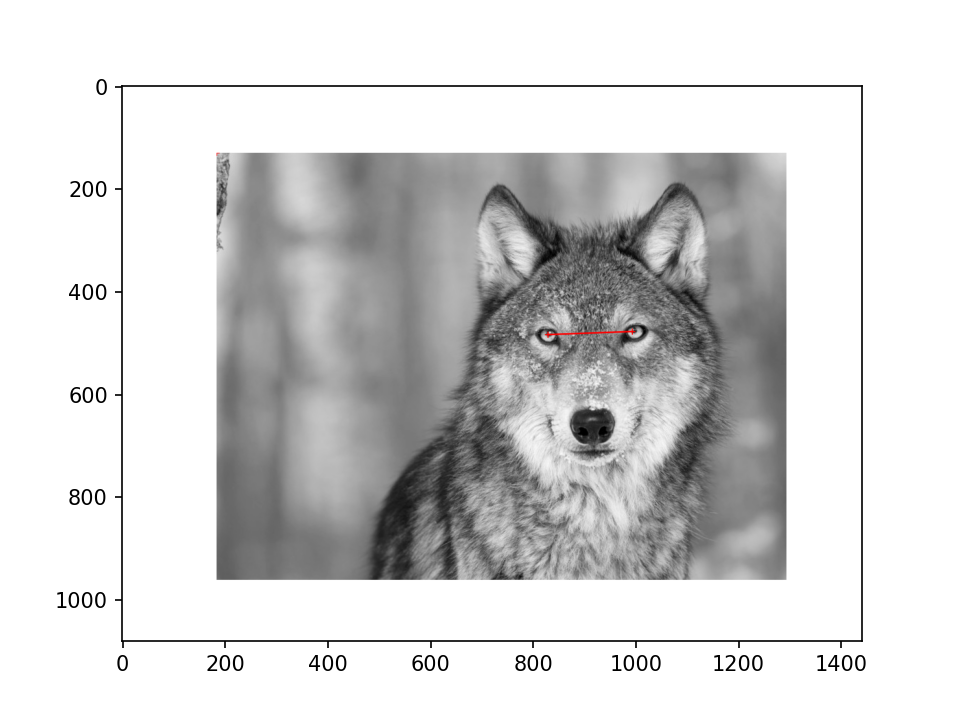

In [61]:
plt.figure()
plt.imshow(cv2.cvtColor(cv2.imread('./wolf_align.png'), cv2.COLOR_BGR2RGB))

In [104]:
pts_im2 = utils.prompt_eye_selection(im2)
# pts_im2 = np.array([[299,343], [439,331]]) # uncomment if entering [x, y] pts manually
plt.plot(pts_im2[:,0], pts_im2[:,1], 'r-+')

<IPython.core.display.Javascript object>

Image is not showing in the preview properly so I am adding it here

<IPython.core.display.Javascript object>


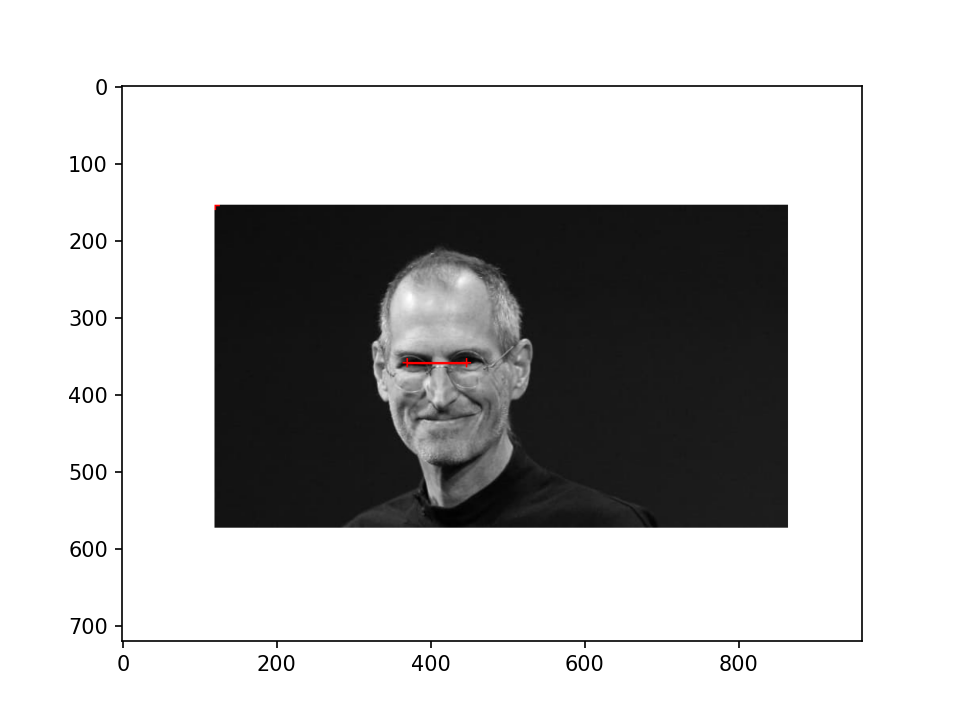

In [62]:
plt.figure()
plt.imshow(cv2.cvtColor(cv2.imread('./jobs_align.png'), cv2.COLOR_BGR2RGB))

In [105]:
im1, im2 = utils.align_images(im1_file, im2_file,pts_im1,pts_im2,save_images=False)


In [106]:
# convert to grayscale
im1 = cv2.cvtColor(im1, cv2.COLOR_BGR2GRAY) / 255.0
im2 = cv2.cvtColor(im2, cv2.COLOR_BGR2GRAY) / 255.0

<IPython.core.display.Javascript object>


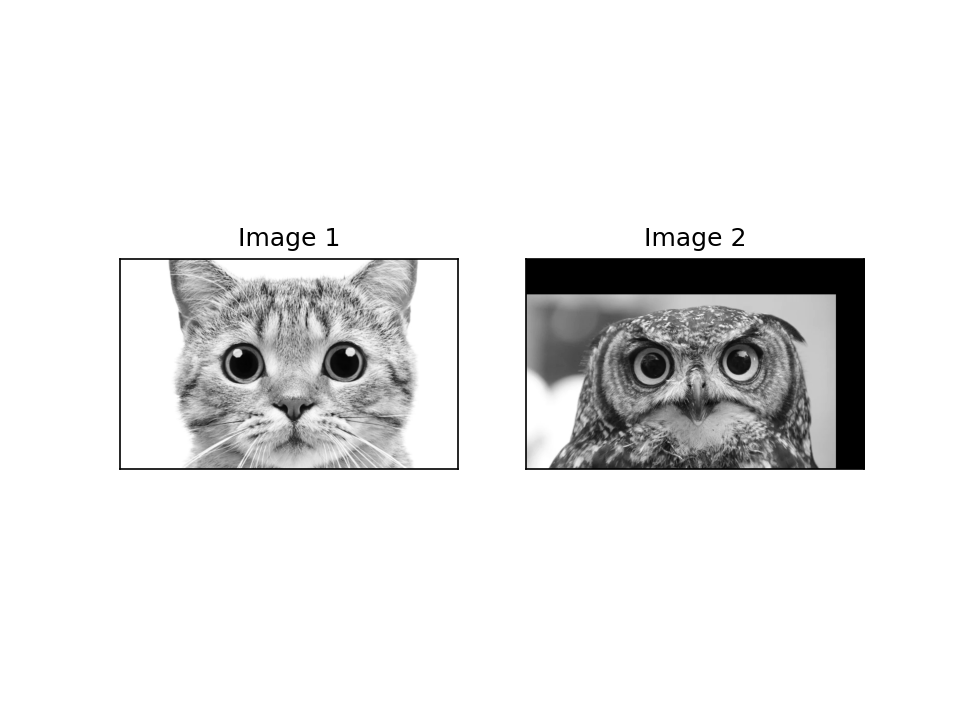

In [107]:
#Images sanity check
fig, axes = plt.subplots(1, 2)
axes[0].imshow(im1,cmap='gray')
axes[0].set_title('Image 1'), axes[0].set_xticks([]), axes[0].set_yticks([])
axes[1].imshow(im2,cmap='gray')
axes[1].set_title('Image 2'), axes[1].set_xticks([]), axes[1].set_yticks([]);

In [108]:
def hybridImage(im1, im2, sigma_low, sigma_high):
    '''
    Inputs:
        im1:    RGB (height x width x 3) or a grayscale (height x width) image
                as a numpy array.
        im2:    RGB (height x width x 3) or a grayscale (height x width) image
                as a numpy array.
        sigma_low: standard deviation for the low-pass filter
        sigma_high: standard deviation for the high-pass filter
        
    Output:
        Return the combination of both images, one filtered with a low-pass filter
        and the other with a high-pass filter.
    '''


    # We would like the hybrid images to be completely grayscaled
    if im1.shape == 3:
        im1 = cv2.cvtColor(im1, cv2.COLOR_BGR2GRAY) /255
    if im2.shape == 3:
        im2 = cv2.cvtColor(im2, cv2.COLOR_BGR2GRAY) /255
        
    # we would like to set the kernel half width to be >= 3 sigma
    low_pass_khalf = 3 * sigma_low
    high_pass_khalf = 3 * sigma_high
    low_pass_ksize = 2 * low_pass_khalf + 1
    high_pass_ksize = 2 * high_pass_khalf + 1
    
    # Using cv2 to smooth out the image with gaussian filter
    low_pass_image = cv2.GaussianBlur(im1, (low_pass_ksize, low_pass_ksize), sigma_low)
    
    # Using cv2 to filter the image with Laplacian filter
    high_pass_image = cv2.GaussianBlur(im2, (high_pass_ksize, high_pass_ksize), sigma_high, cv2.BORDER_REPLICATE)
    high_pass_image = im2 - high_pass_image
    d = plt.figure()
    plt.imshow(low_pass_image, cmap = 'gray')
    p = plt.figure()
    plt.imshow(high_pass_image, cmap = 'gray')
    
    hybrid_image = (low_pass_image + high_pass_image)
    
    im1_fft = plt.figure("Image 1 FFT ")
    plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(im1)))))
    plt.title("Fast Fourier Transform of Image 1")
    
    im2_fft = plt.figure("Image 2 FFT ")
    plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(im2)))))
    plt.title("Fast Fourier Transform of Image 2")
    
    im1_filtered = plt.figure("Image 1 Filtered Low Pass Image FFT")
    plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(low_pass_image)))))
    plt.title("Fast Fourier Transform of the filtered Low Pass Image")
    
    im2_filtered = plt.figure("Image 2 Filtered High Pass Image FFT")
    plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(high_pass_image)))))
    plt.title("Fast Fourier Transform of the filtered High Pass Image")
    
    hybridim_fft = plt.figure("Hyrid Image FFT ")
    plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(hybrid_image)))))
    plt.title("Fast Fourier Transform of the Hybrid Image")

    return hybrid_image
    


<IPython.core.display.Javascript object>


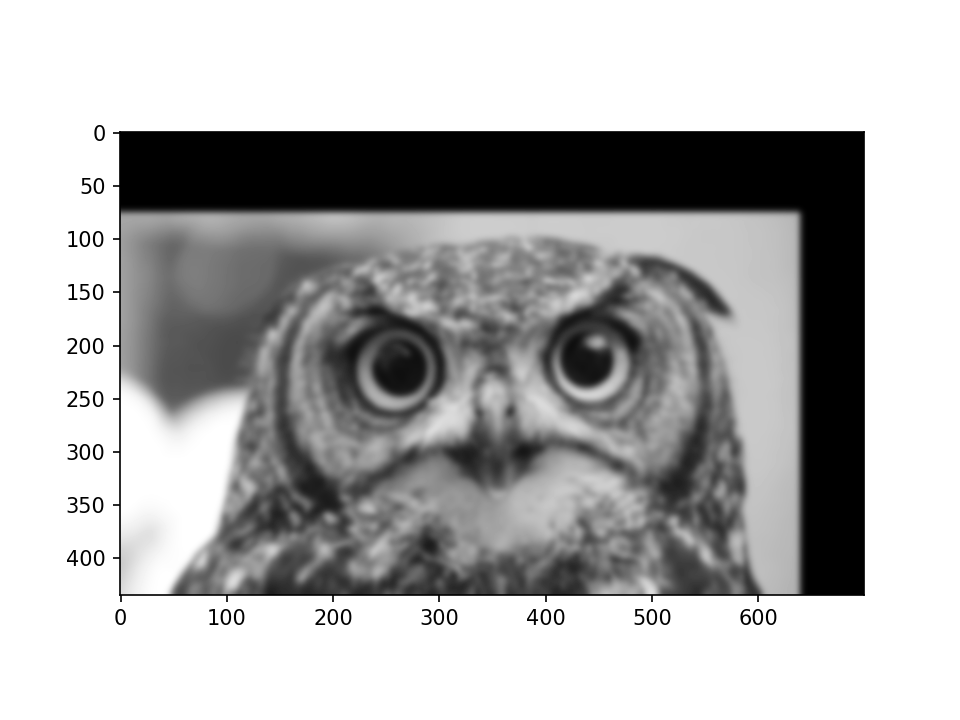

<IPython.core.display.Javascript object>


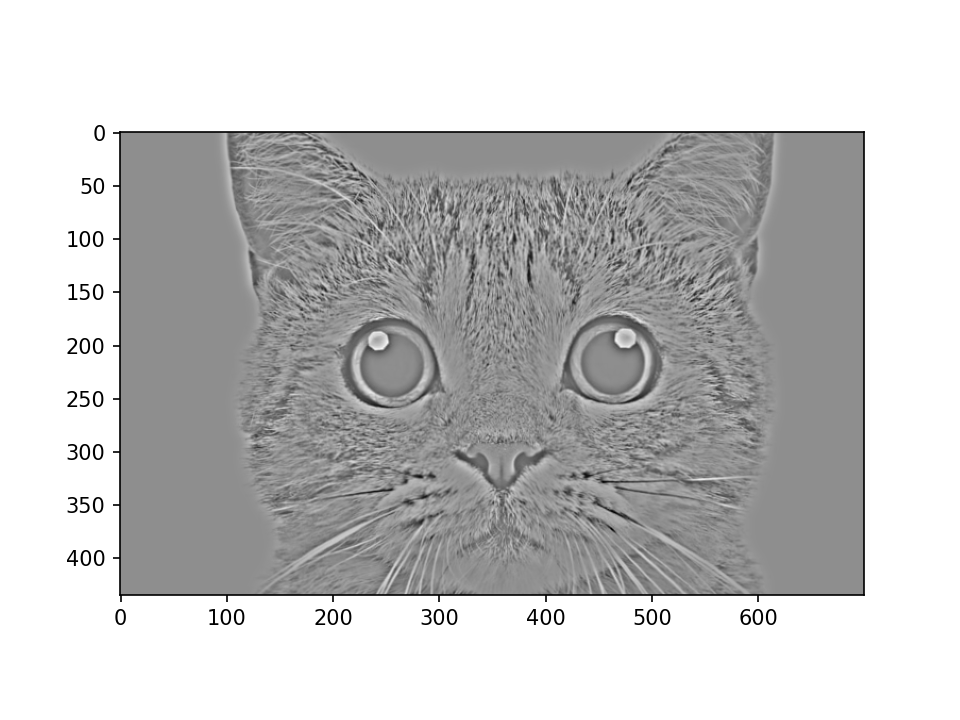

<IPython.core.display.Javascript object>


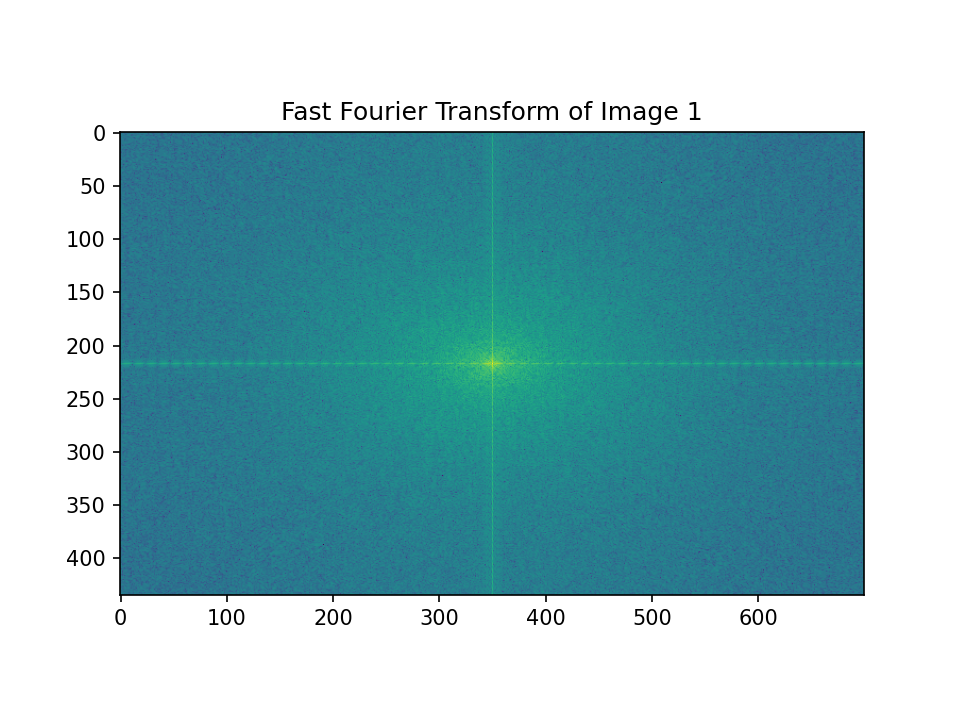

<IPython.core.display.Javascript object>


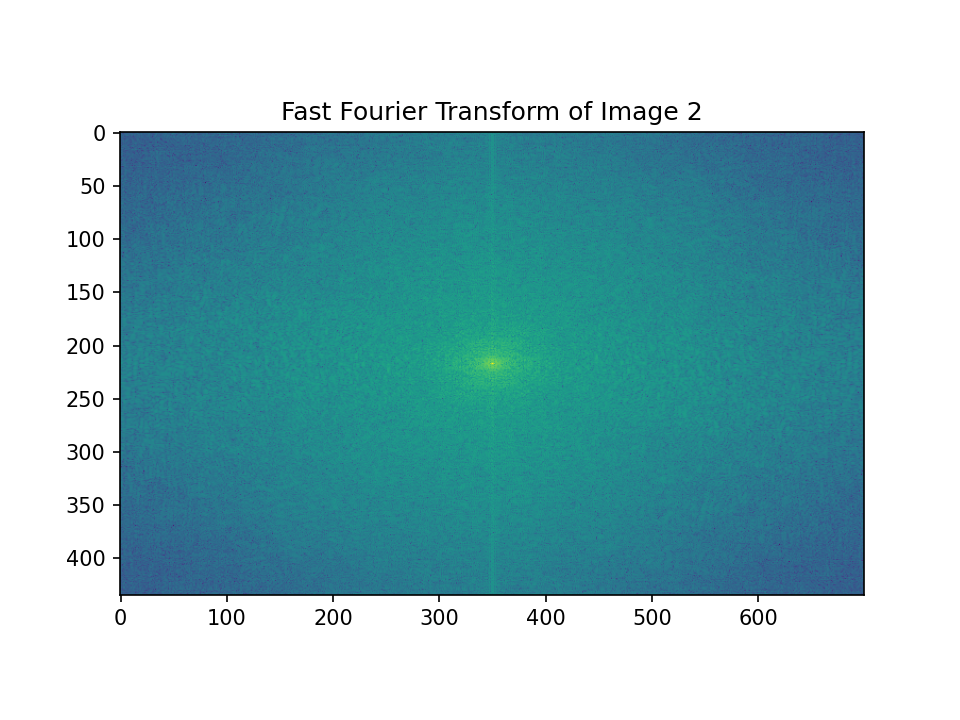

<IPython.core.display.Javascript object>


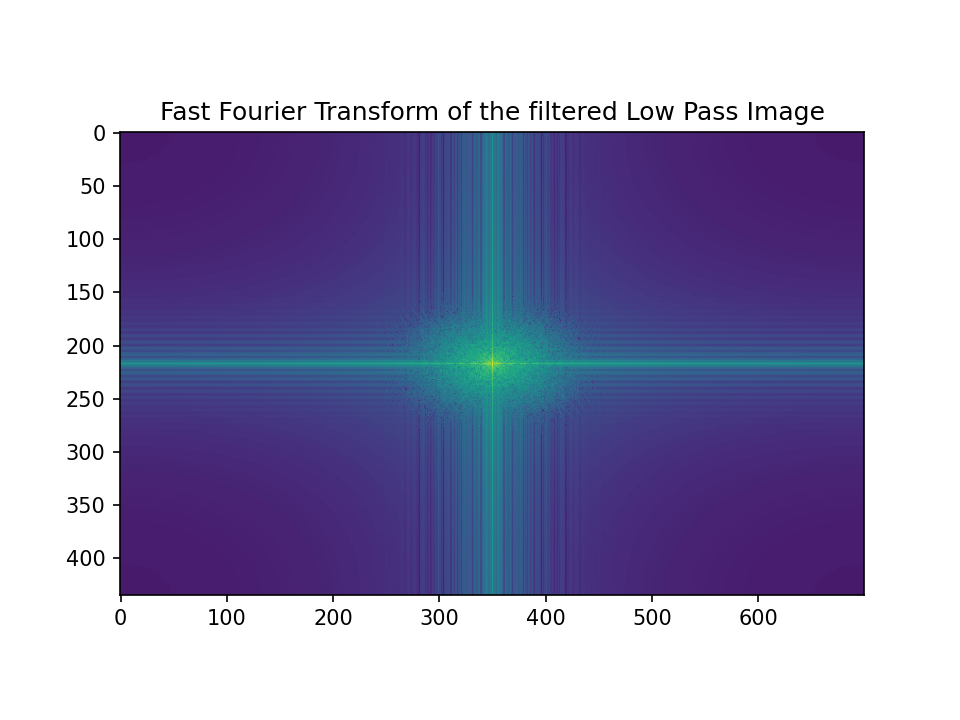

<IPython.core.display.Javascript object>


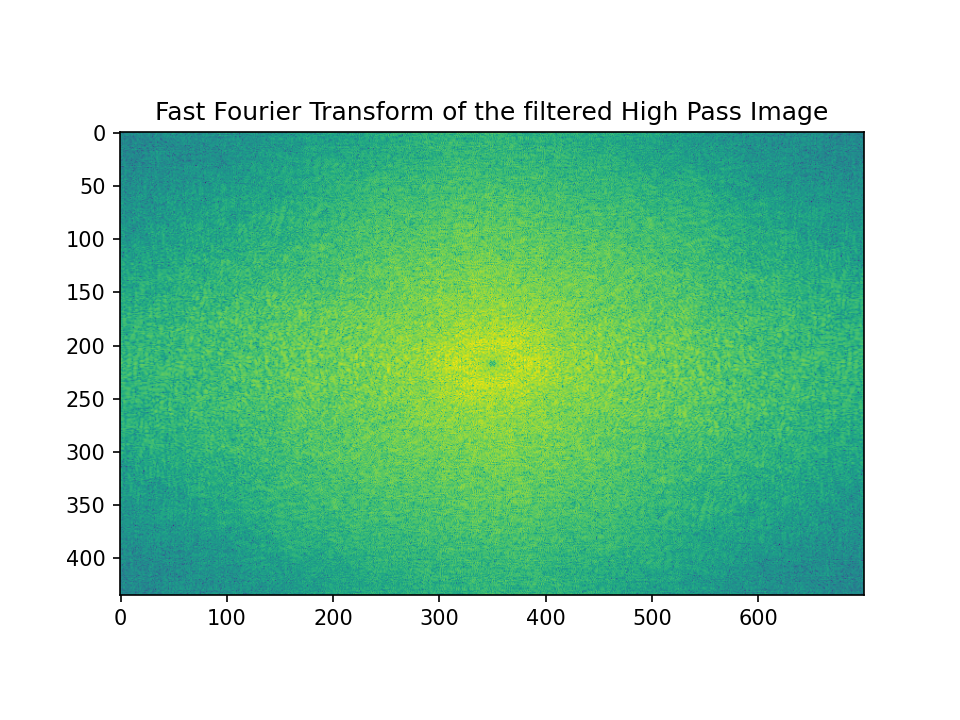

<IPython.core.display.Javascript object>


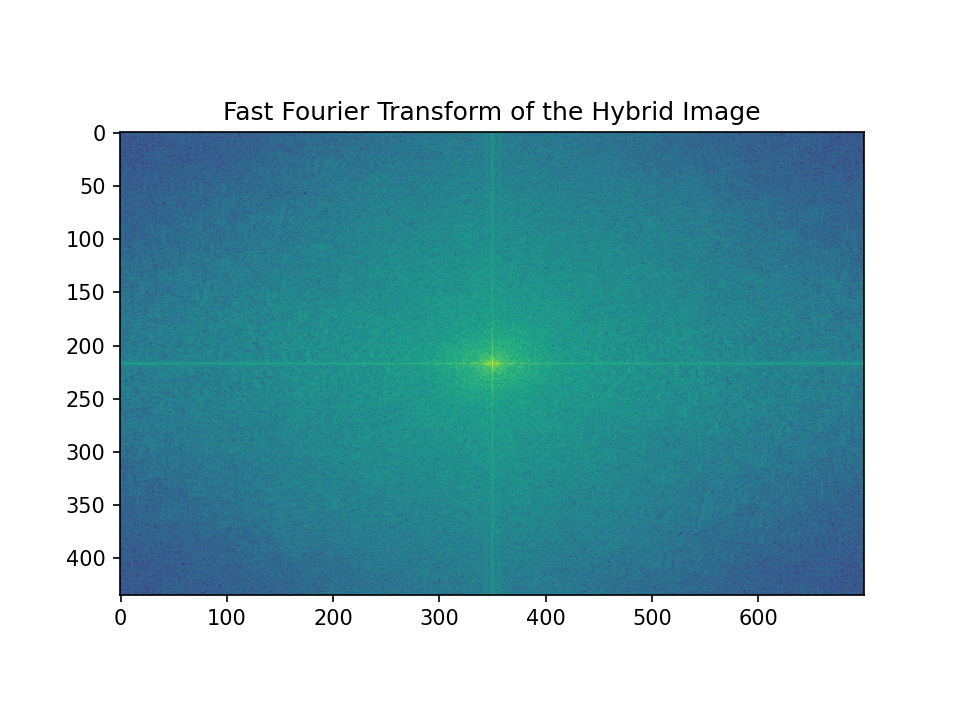

<IPython.core.display.Javascript object>


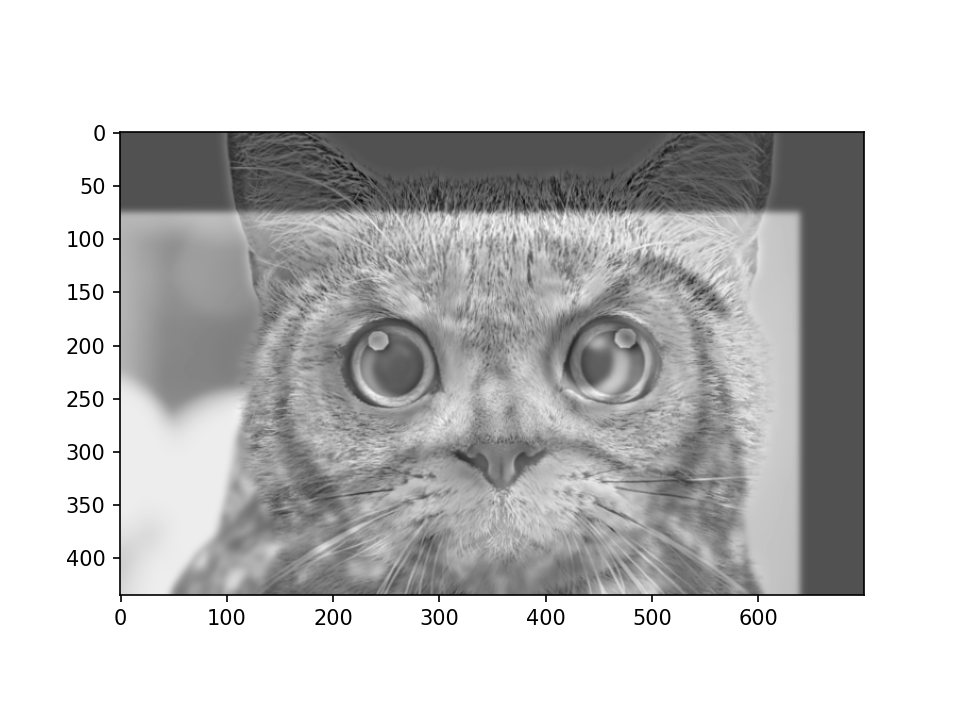

In [113]:
sigma_low = 3 # choose parameters that work for your images
sigma_high = 5

im_hybrid = hybridImage(im2, im1, sigma_low, sigma_high)
plt.figure("Final")
plt.imshow(im_hybrid, cmap = 'gray')



<IPython.core.display.Javascript object>


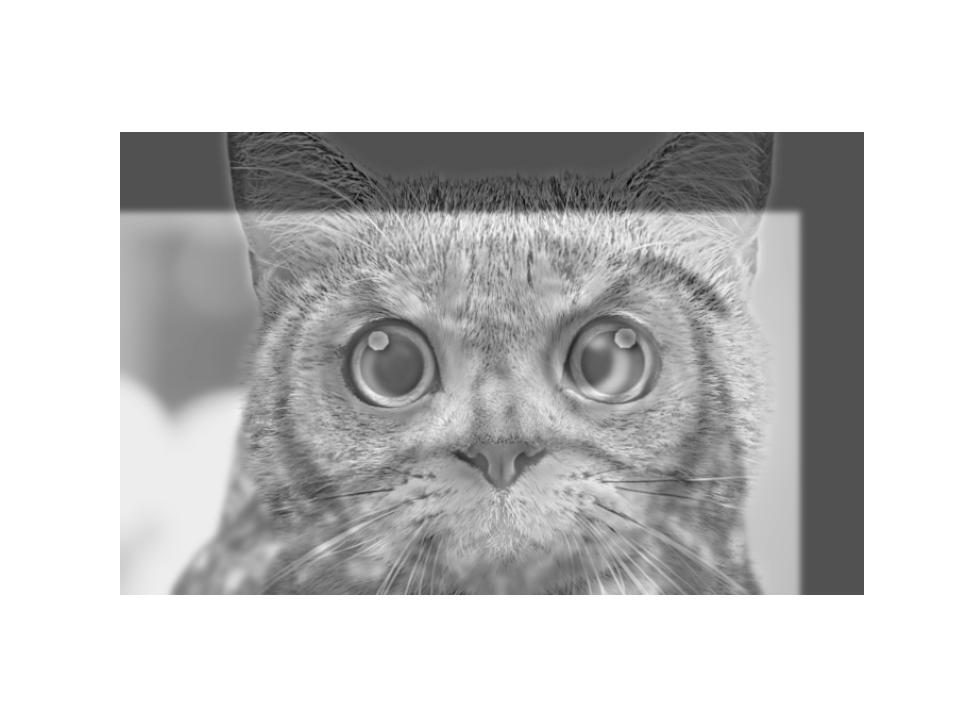

In [114]:
cropped_object = utils.interactive_crop(im_hybrid)

Image is not showing properly in preview so I am adding it here

<IPython.core.display.Javascript object>


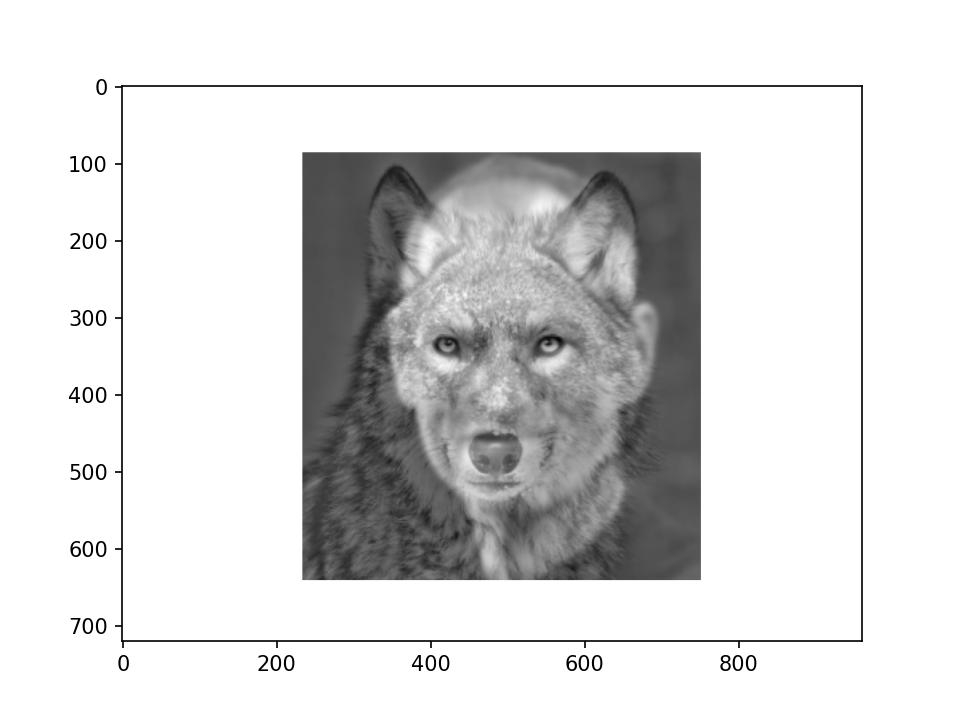

In [63]:
plt.figure()
plt.imshow(cv2.cvtColor(cv2.imread('./hybrid_cropped.png'), cv2.COLOR_BGR2RGB))

### Part II: Image Enhancement

##### Two out of three types of image enhancement are required.  Choose a good image to showcase each type and implement a method.  This code doesn't rely on the hybrid image part.

#### Contrast enhancement

<IPython.core.display.Javascript object>


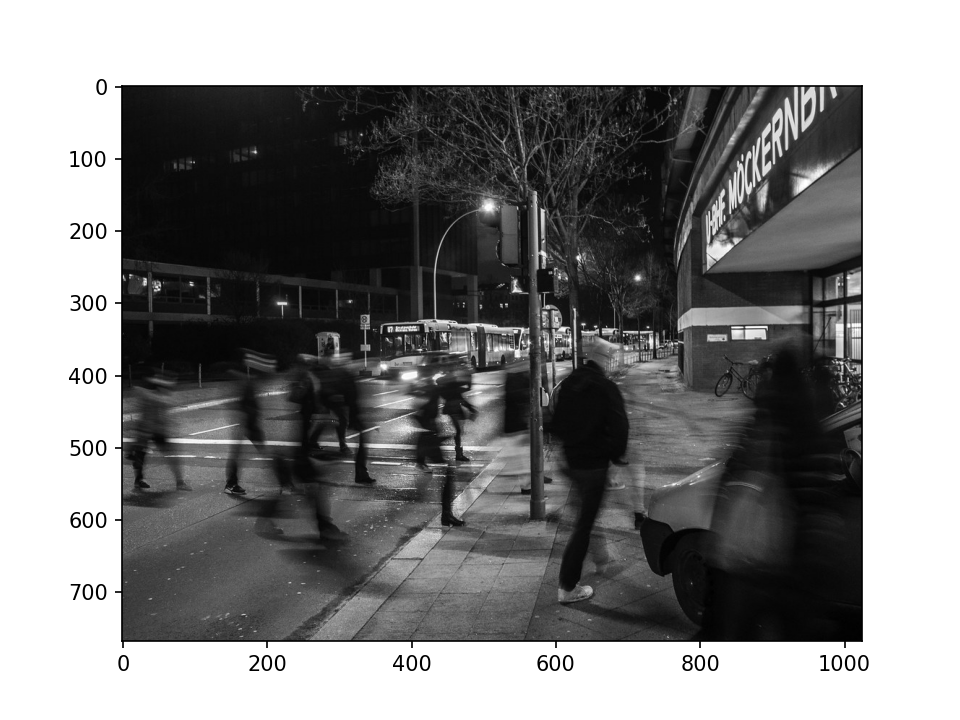

<IPython.core.display.Javascript object>


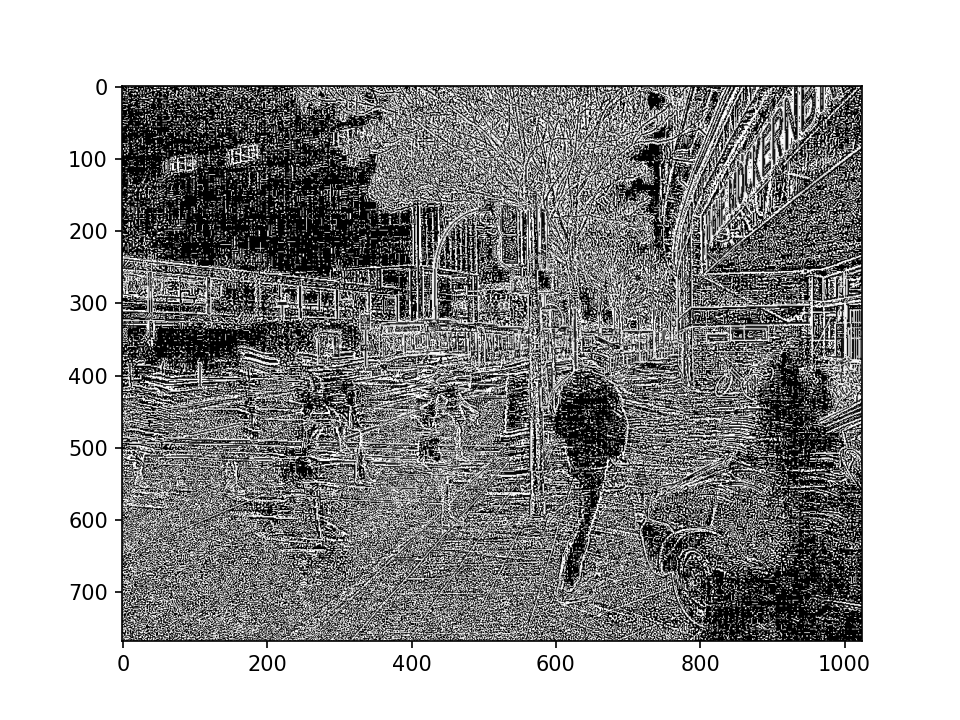

<IPython.core.display.Javascript object>


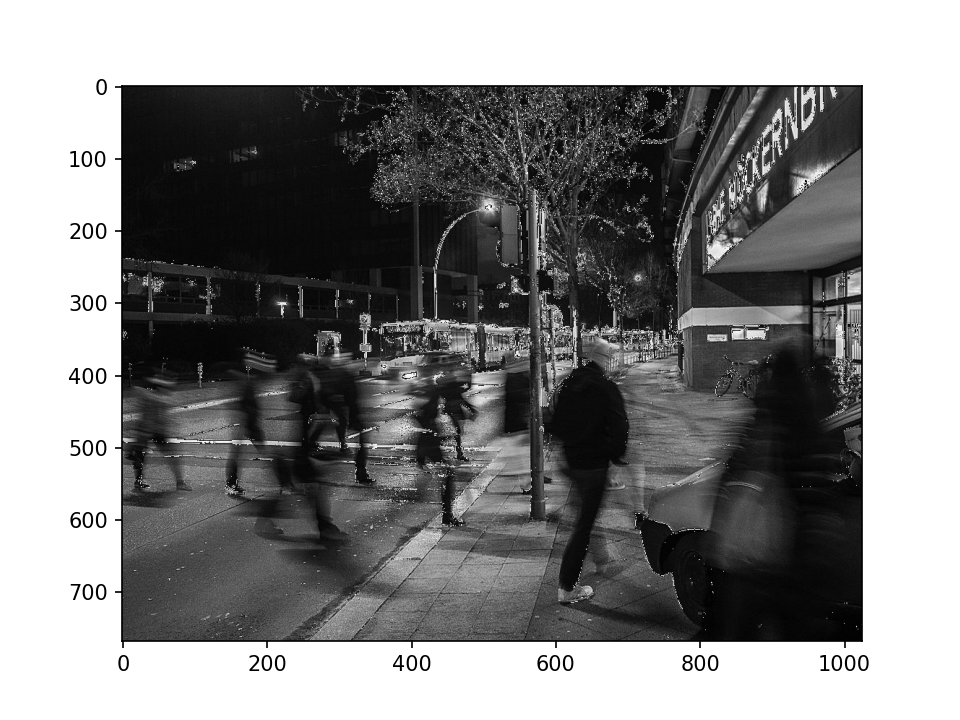

In [30]:
# Contrast enhancement
im1_file = datadir + 'blurimage.jpeg'

im1 = cv2.imread(im1_file)
im1_rgb = cv2.cvtColor(im1, cv2.COLOR_BGR2RGB)

im1_gray = cv2.cvtColor(im1, cv2.COLOR_BGR2GRAY)
plt.figure("Contrast Enhancement Original Gray")
plt.imshow(im1_gray, cmap = 'gray')

gau_im = cv2.GaussianBlur(im1_gray, (11, 11), cv2.BORDER_REPLICATE)
lap = im1_gray - gau_im
plt.figure("Laplacian Image")
plt.imshow(lap, cmap = "gray")
contrast_enhancement = im1_gray + lap
plt.figure("Contrast Enhancement Output")
plt.imshow(contrast_enhancement, cmap = 'gray')





#### Color enhancement 

<IPython.core.display.Javascript object>


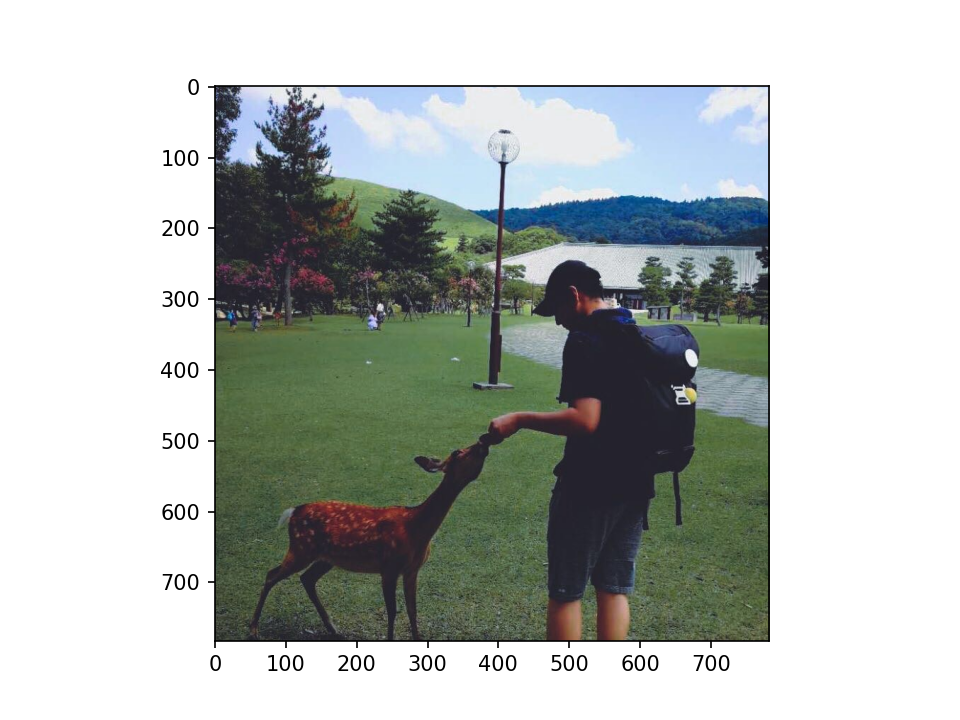

<IPython.core.display.Javascript object>


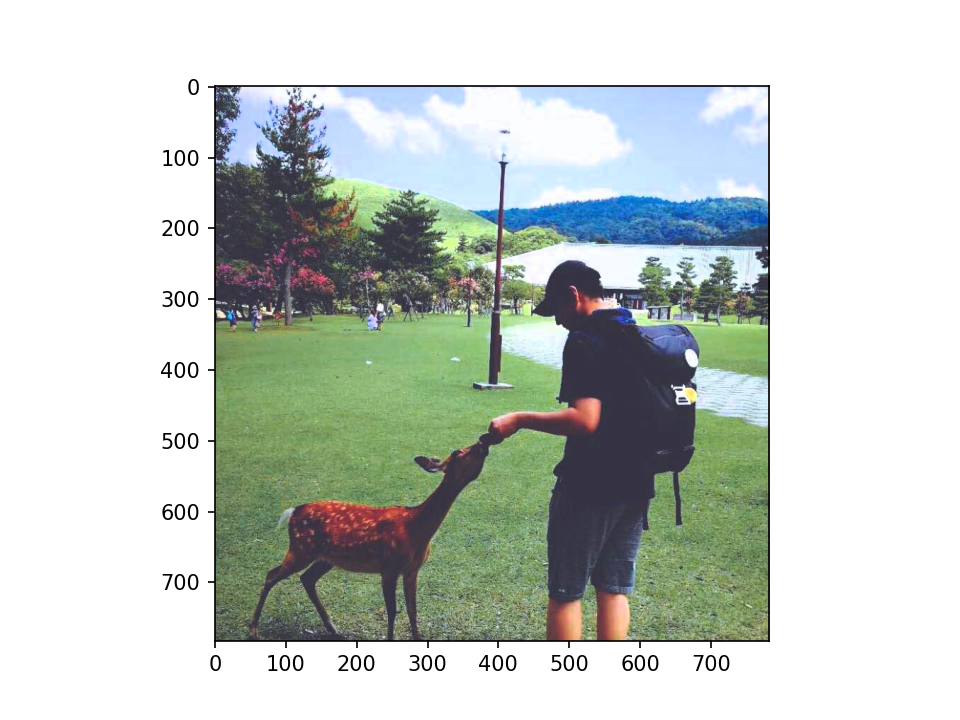

In [31]:
# Color enhancement
# picture data path
im1_file = datadir + 'enh.JPG'
# Read images
im1 = cv2.imread(im1_file)

# Converting to RGB for displaying
im1 = cv2.cvtColor(im1, cv2.COLOR_BGR2RGB)
# display the original
plt.figure("Color Enhancement Original Image")
plt.imshow(im1)

# Converting to HSV
im1_HSV = cv2.cvtColor(im1, cv2.COLOR_RGB2HSV)

# Enhancement or reduce value
val = 50
if val > 100:
    val = 100
elif val < 0:
    val = 0

enhance = 1 +(val / 100)
reduce = 1- (val/100)

# Enhancing
# H = im1_HSV[:,:,0] 
# S = im1_HSV[:,:,1]
V = im1_HSV[:,:,2]*enhance
V[V>255] = 255
im1_HSV[:,:,2] = V

# Display final result
plt.figure("Color Enhancement Output Image")
plt.imshow(cv2.cvtColor(im1_HSV, cv2.COLOR_HSV2RGB))

#### Color shift

<IPython.core.display.Javascript object>


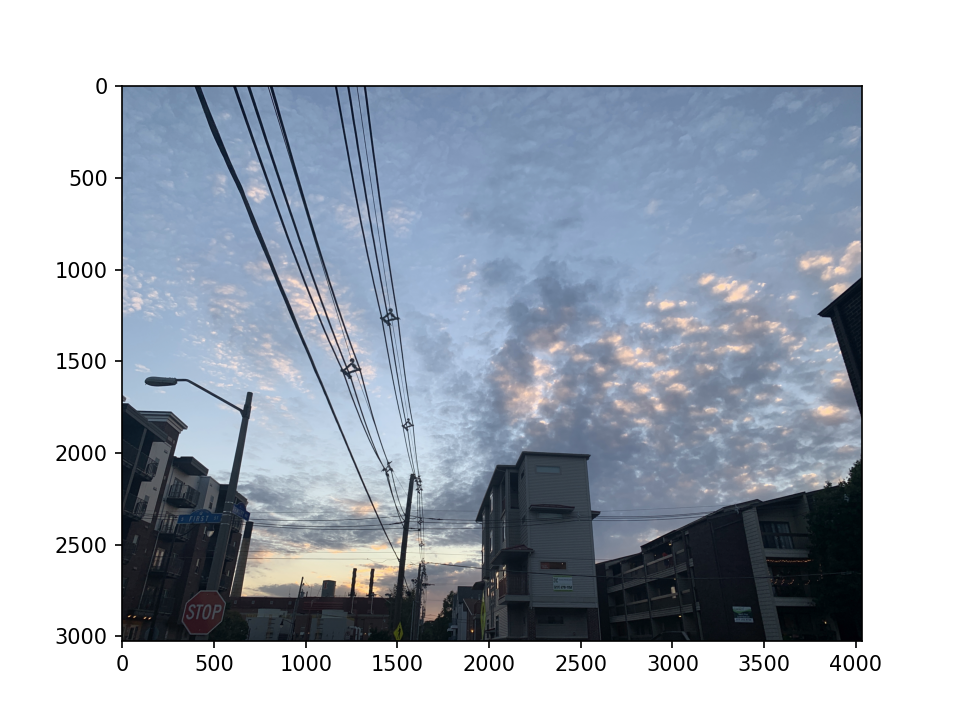

<IPython.core.display.Javascript object>


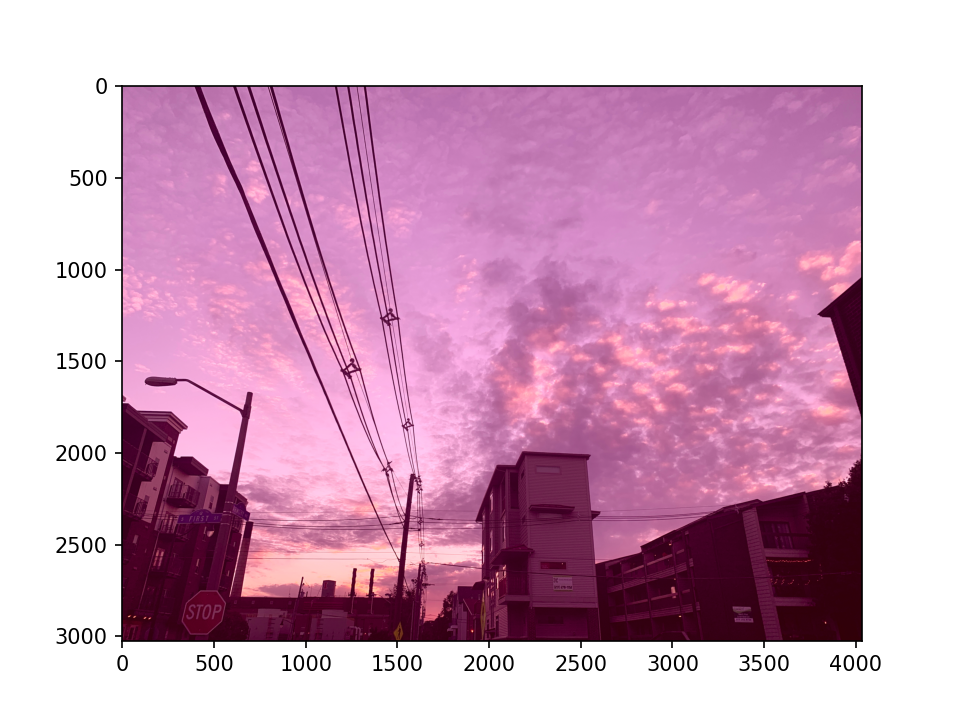

<IPython.core.display.Javascript object>


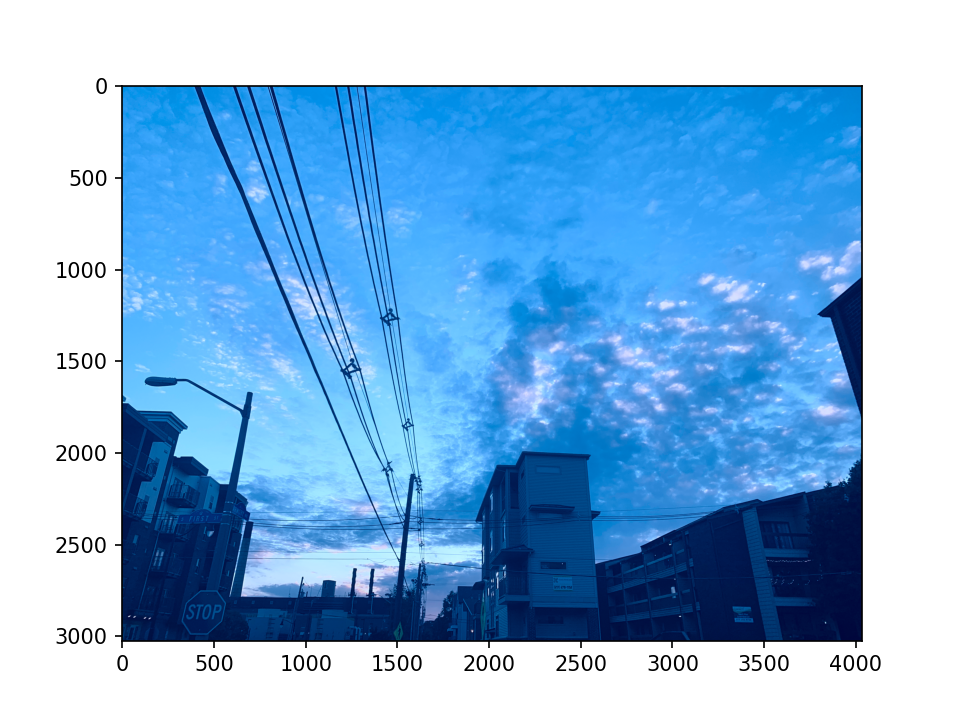

In [32]:
# Color shift

# picture data path
im1_file = datadir + 'shift.JPG'

# Reading images
im1 = cv2.imread(im1_file)
red_shift = cv2.imread(im1_file)
yellow_shift = cv2.imread(im1_file)

# Converting them to Lab
im1_rgb = cv2.cvtColor(im1, cv2.COLOR_BGR2Lab)
red_shift =  cv2.cvtColor(red_shift, cv2.COLOR_BGR2Lab)
yellow_shift = cv2.cvtColor(yellow_shift, cv2.COLOR_BGR2Lab)



# Percentage for shifting in red 
red_percent = 30
# make sure it is within the 0%-100% range
if red_percent > 100:
    red_percent = 100
elif red_percent < 0:
    red_percent = 0

# Percentage you want to reduce in yellow
yellow_percent = 30
if yellow_percent > 100:
    yellow_percent = 100
elif yellow_percent < 0:
    yellow_percent = 0


# Converting to multiplier value
red_percent = 1+red_percent/100
yellow_percent = 1-yellow_percent/100

# Shifting
red_shift[:, :, 1] = im1_rgb[:, :, 1] * red_percent
yellow_shift[:, :, 2] = im1_rgb[:, :, 2] * yellow_percent


# Displaying the images
plt.figure("Original Image")
plt.imshow(cv2.cvtColor(im1_rgb, cv2.COLOR_Lab2RGB))
plt.figure("Red Shift")
plt.imshow(cv2.cvtColor(red_shift, cv2.COLOR_Lab2RGB))
plt.figure("Yellow Shift")
plt.imshow(cv2.cvtColor(yellow_shift, cv2.COLOR_Lab2RGB))


## Bells & Whistles (Extra Points)

### We need to restart for a colorful hybrid image

In [124]:
im1_file = datadir + 'trump.jpeg'
im2_file = datadir + 'biden.jpeg'

im1 = np.float32(cv2.imread(im1_file) / 255.0)
im2 = np.float32(cv2.imread(im2_file) / 255.0)

In [125]:
pts_im1 = utils.prompt_eye_selection(im1)
# pts_im1 = np.array([[607, 290], [748, 370]]) # uncomment if entering [x, y] pts manually
plt.plot(pts_im1[:,0], pts_im1[:,1], 'r-+')

<IPython.core.display.Javascript object>

Image not showing properly on preview so I am adding here

<IPython.core.display.Javascript object>


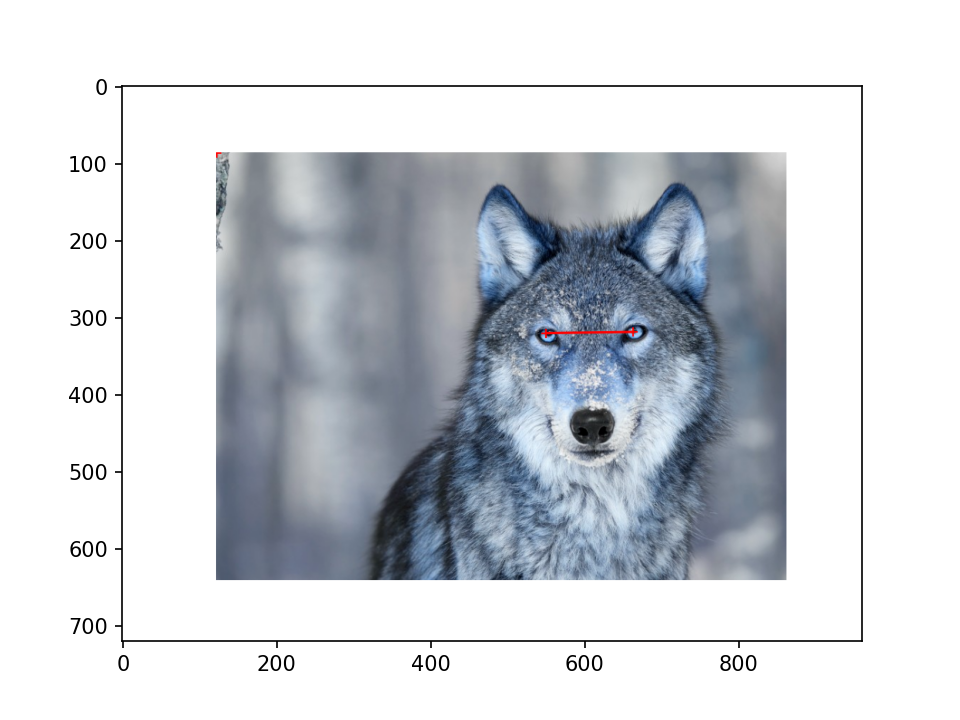

In [64]:
plt.figure()
plt.imshow(cv2.cvtColor(cv2.imread('./wolf_align_color.png'), cv2.COLOR_BGR2RGB))

In [127]:
pts_im2 = utils.prompt_eye_selection(im2)
# pts_im2 = np.array([[299,343], [439,331]]) # uncomment if entering [x, y] pts manually
plt.plot(pts_im2[:,0], pts_im2[:,1], 'r-+')

<IPython.core.display.Javascript object>

Image not showing properly on preview so i am adding it here

<IPython.core.display.Javascript object>


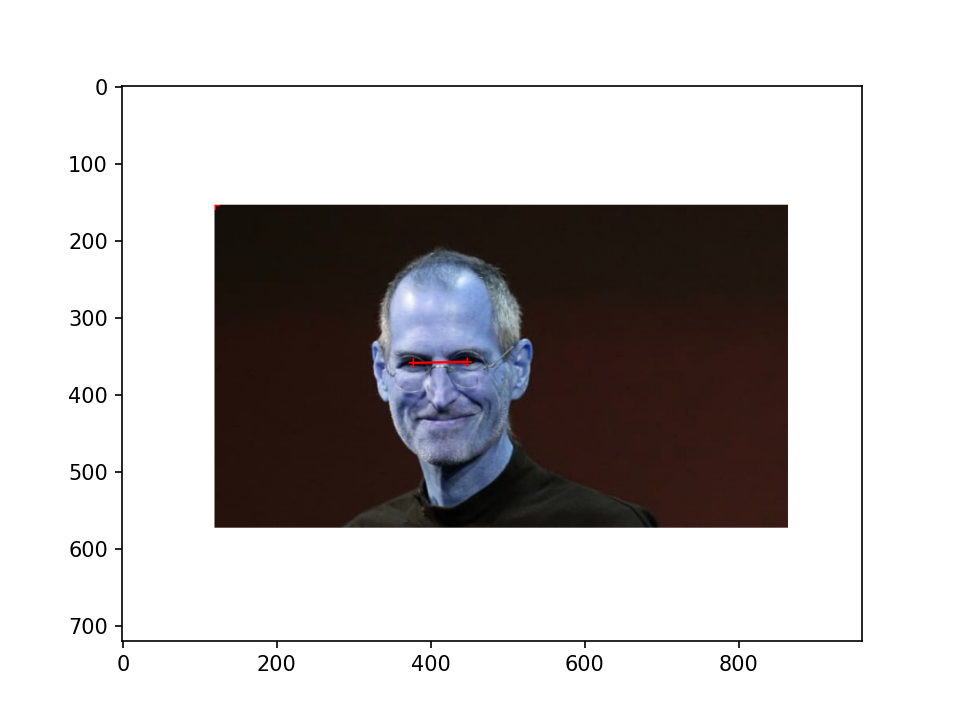

In [65]:
plt.figure()
plt.imshow(cv2.cvtColor(cv2.imread('./jobs_align_color.png'), cv2.COLOR_BGR2RGB))

In [128]:
im1, im2 = utils.align_images(im1_file, im2_file,pts_im1,pts_im2,save_images=False)

In [129]:
def colorhybridImage(im1, im2, sigma_low, sigma_high):
    im1 = cv2.cvtColor(im1, cv2.COLOR_BGR2RGB) / 255
    im2 = cv2.cvtColor(im2, cv2.COLOR_BGR2GRAY) /255
    '''
    Inputs:
        im1:    RGB (height x width x 3) or a grayscale (height x width) image
                as a numpy array.
        im2:    RGB (height x width x 3) or a grayscale (height x width) image
                as a numpy array.
        sigma_low: standard deviation for the low-pass filter
        sigma_high: standard deviation for the high-pass filter
        
    Output:
        Return the combination of both images, one filtered with a low-pass filter
        and the other with a high-pass filter.
    '''
    # your code goes here  
    # We would like the hybrid images to be completely grayscaled
    '''
    if im1.shape == 3:
        im1 = cv2.cvtColor(im1, cv2.COLOR_BGR2GRAY) /255
    if im2.shape == 3:
        im2 = cv2.cvtColor(im2, cv2.COLOR_BGR2GRAY) /255
    '''
        
    ## we would like to set the kernel half width to be >= 3 sigma
    low_pass_khalf = 3 * sigma_low
    high_pass_khalf = 3 * sigma_high
    low_pass_ksize = 2 * low_pass_khalf + 1
    high_pass_ksize = 2 * high_pass_khalf + 1
    
    # Using cv2 to smooth out the image with gaussian filter
    low_pass_image = cv2.GaussianBlur(im1, (low_pass_ksize, low_pass_ksize), sigma_low)
    
    # Using cv2 to filter the image with Laplacian filter
    high_pass_image = cv2.GaussianBlur(im2, (high_pass_ksize, high_pass_ksize), sigma_high, cv2.BORDER_REPLICATE)
    high_pass_image = im2 - high_pass_image
    d = plt.figure()
    plt.imshow(low_pass_image)
    p = plt.figure()
    plt.imshow(high_pass_image, cmap = "gray")

    high_pass_cvt = cv2.merge([high_pass_image, high_pass_image, high_pass_image])
    
    hybrid_image = (low_pass_image + high_pass_cvt)
    
    '''
    im1_fft = plt.figure("Image 1 FFT ")
    plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(im1)))))
    plt.title("Fast Fourier Transform of Image 1")
    
    im2_fft = plt.figure("Image 2 FFT ")
    plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(im2)))))
    plt.title("Fast Fourier Transform of Image 2")
    
    im1_filtered = plt.figure("Image 1 Filtered Low Pass Image FFT")
    plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(low_pass_image)))))
    plt.title("Fast Fourier Transform of the filtered Low Pass Image")
    
    im2_filtered = plt.figure("Image 2 Filtered High Pass Image FFT")
    plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(high_pass_image)))))
    plt.title("Fast Fourier Transform of the filtered High Pass Image")
    
    hybridim_fft = plt.figure("Hyrid Image FFT ")
    plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(hybrid_image)))))
    plt.title("Fast Fourier Transform of the Hybrid Image")
    '''

    return hybrid_image
    


<IPython.core.display.Javascript object>


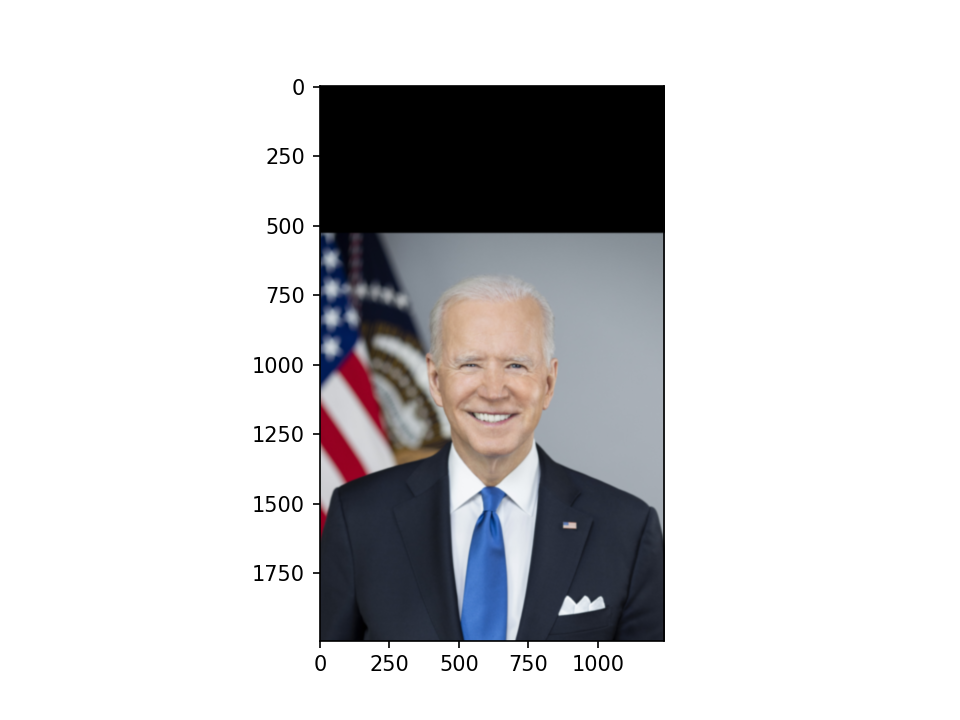

<IPython.core.display.Javascript object>


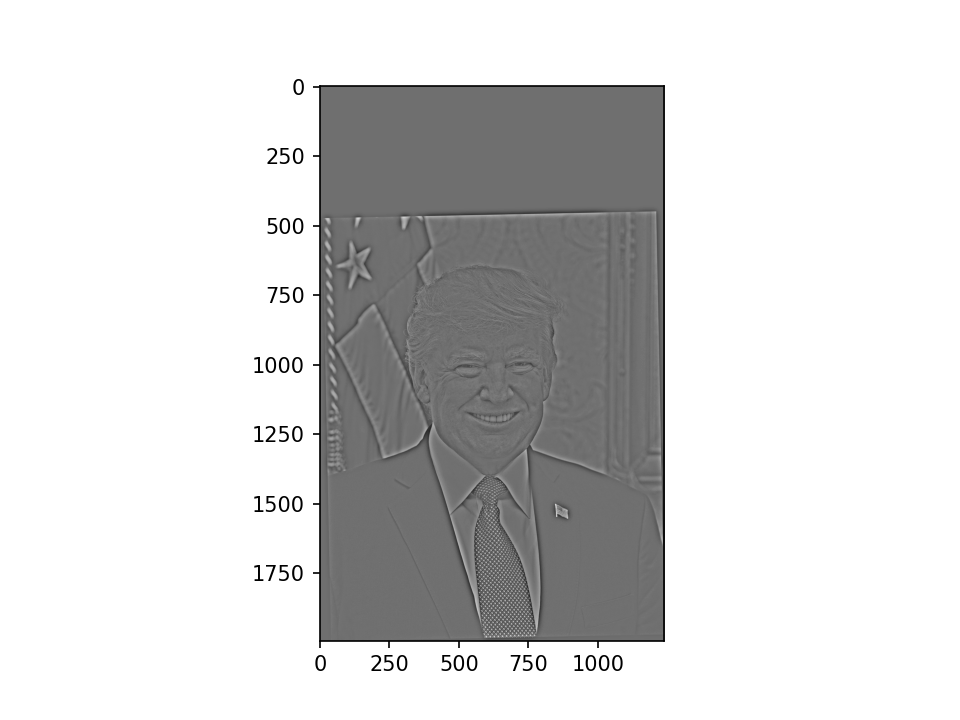

<IPython.core.display.Javascript object>


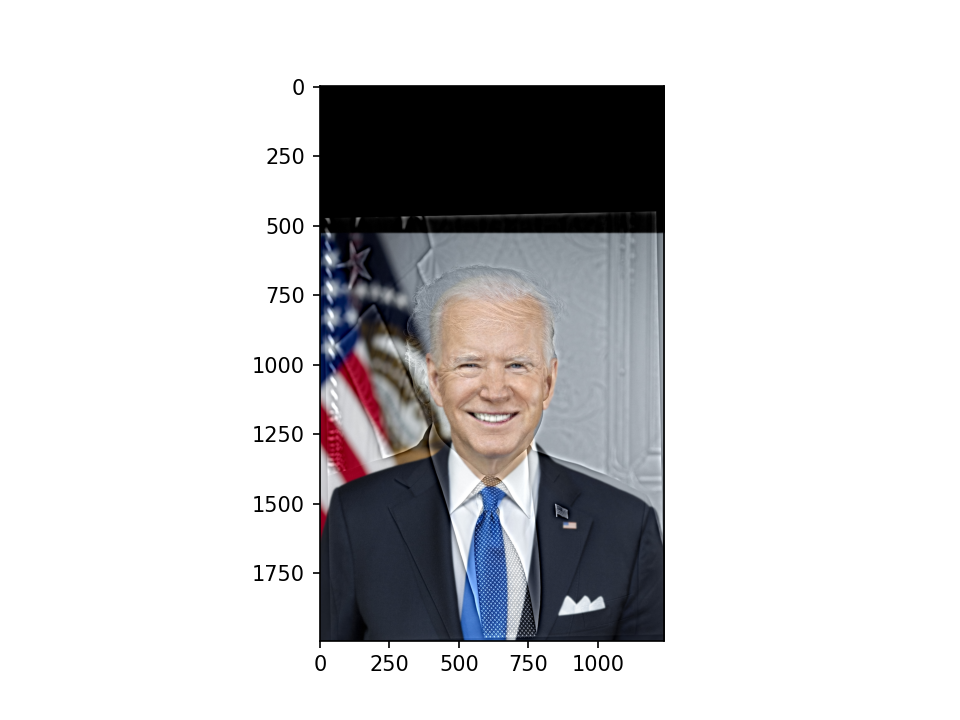

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


In [130]:
sigma_low = 2 # choose parameters that work for your images
sigma_high = 10

im_hybrid = colorhybridImage(im2, im1, sigma_low, sigma_high)
plt.figure("Final")
plt.imshow(im_hybrid)

<IPython.core.display.Javascript object>


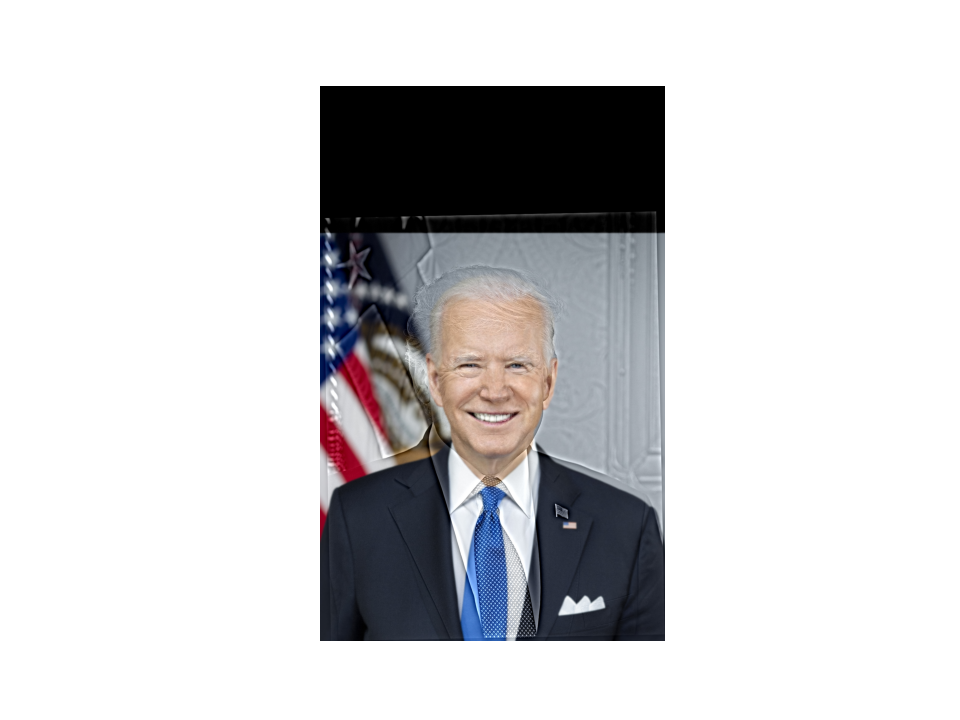

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


In [132]:
cropped_object = utils.interactive_crop(im_hybrid)

Image not showing properly on preview so I am adding it here

<IPython.core.display.Javascript object>


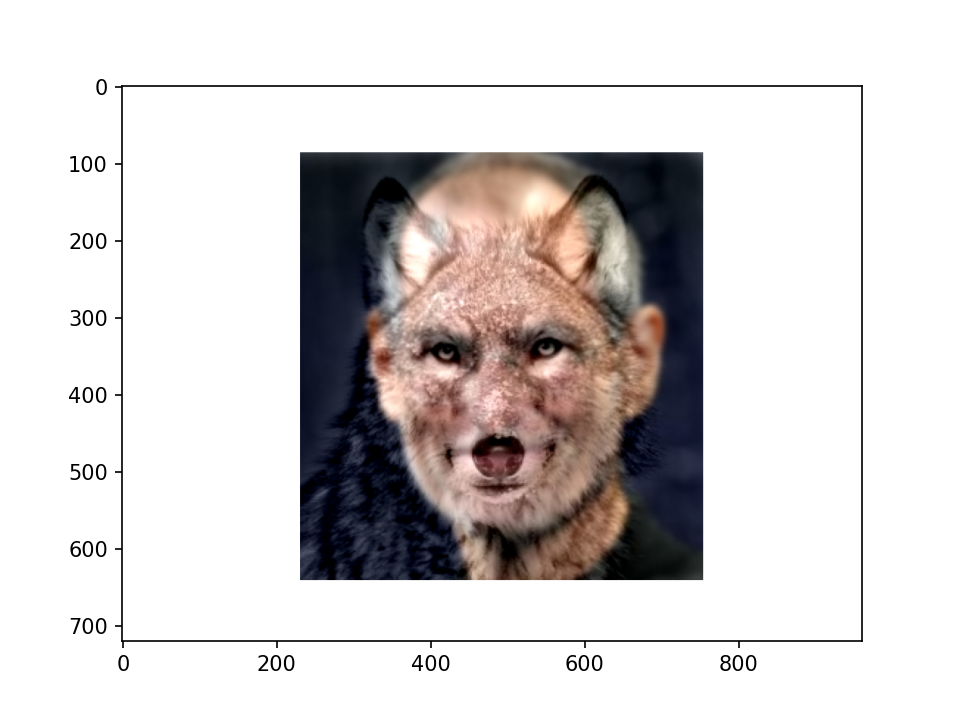

In [131]:
plt.figure()
plt.imshow(cv2.cvtColor(cv2.imread('./hybrid_color.png'), cv2.COLOR_BGR2RGB))

<IPython.core.display.Javascript object>


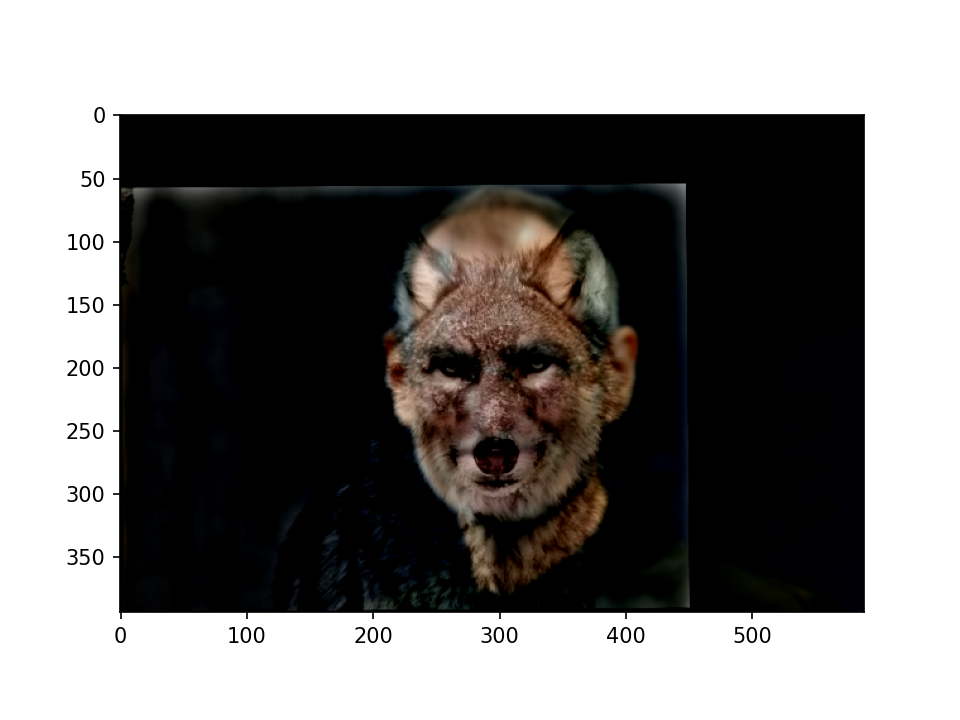

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


In [74]:
L = cv2.GaussianBlur(im_hybrid, (601, 601), 100, cv2.BORDER_REPLICATE)
L = im_hybrid - L
plt.figure()
plt.imshow(L)

<IPython.core.display.Javascript object>


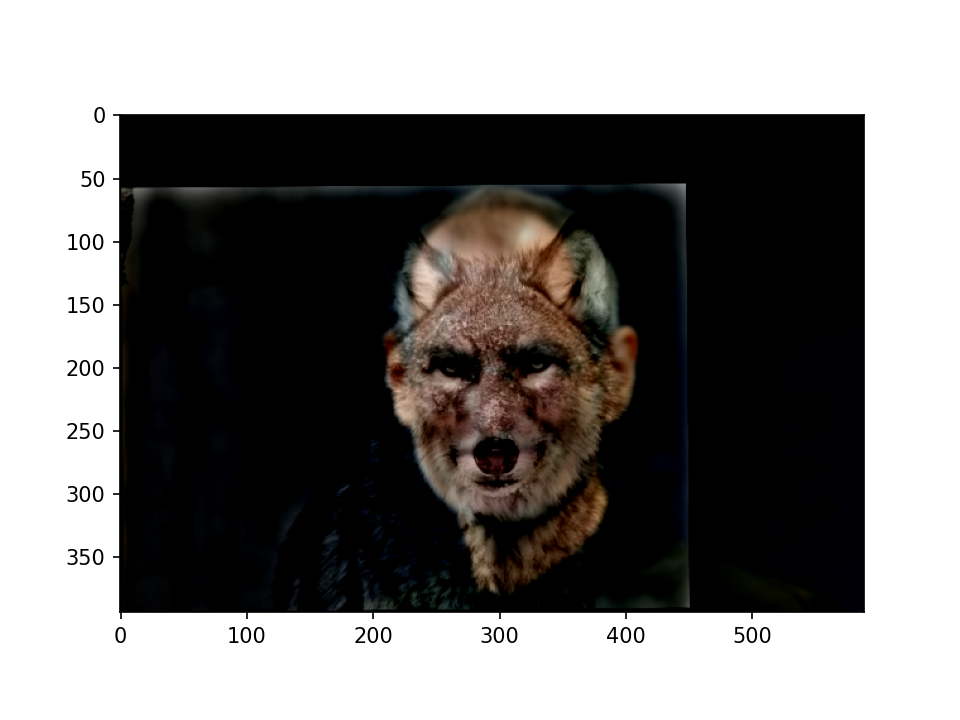

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<IPython.core.display.Javascript object>


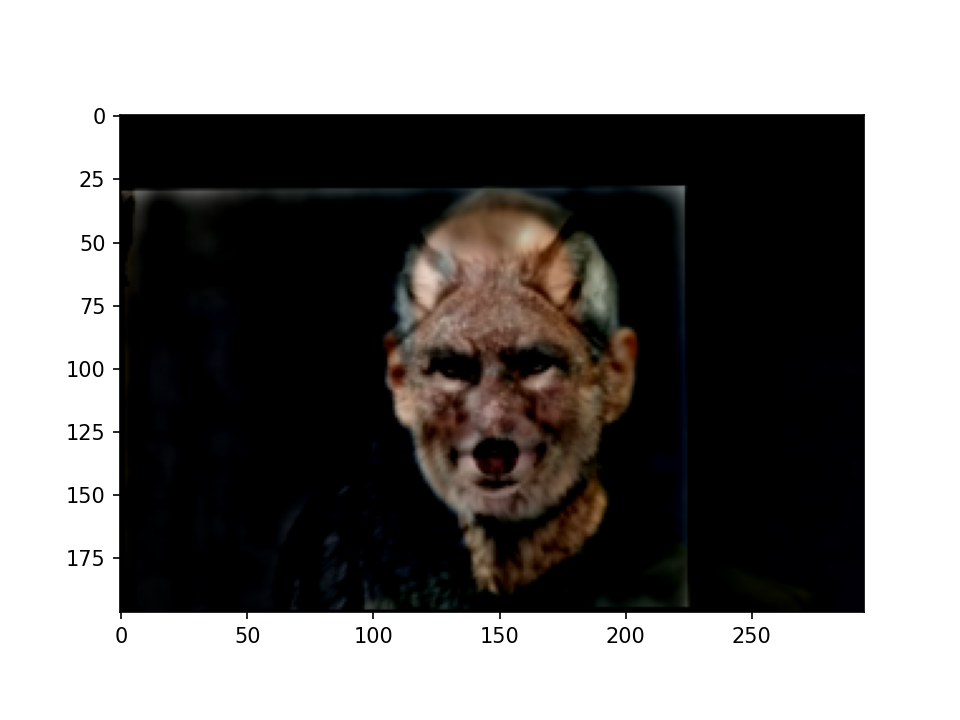

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<IPython.core.display.Javascript object>


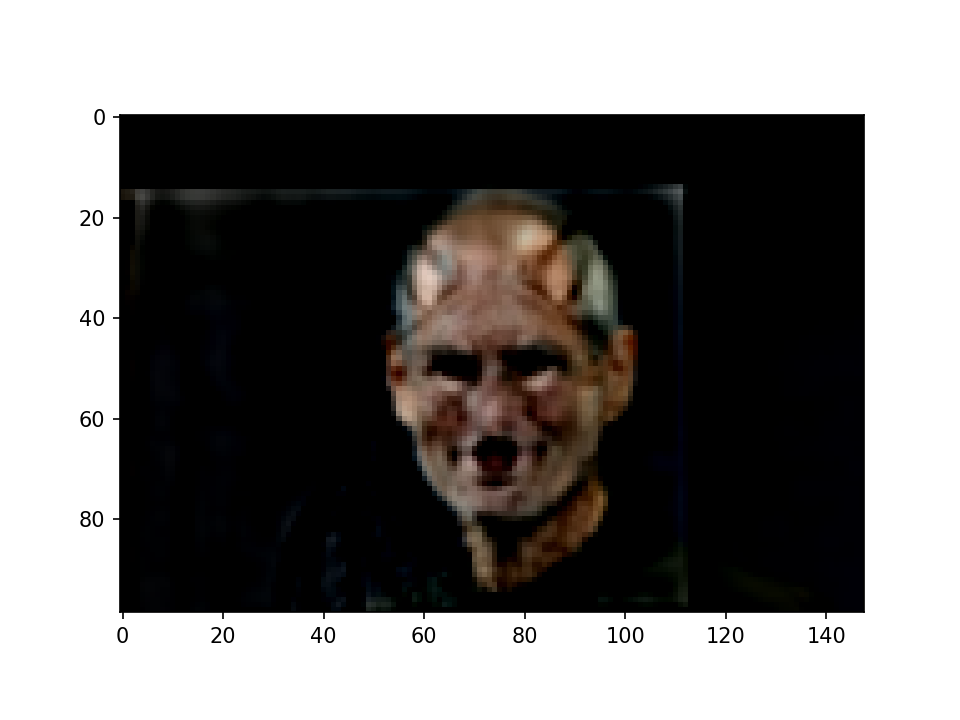

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<IPython.core.display.Javascript object>


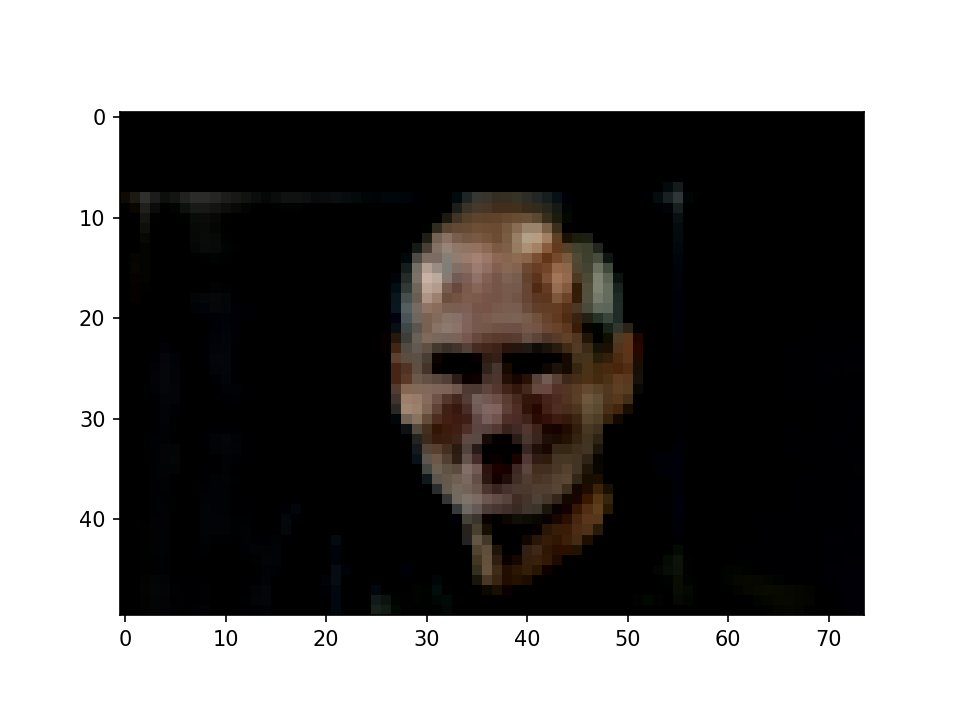

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<IPython.core.display.Javascript object>


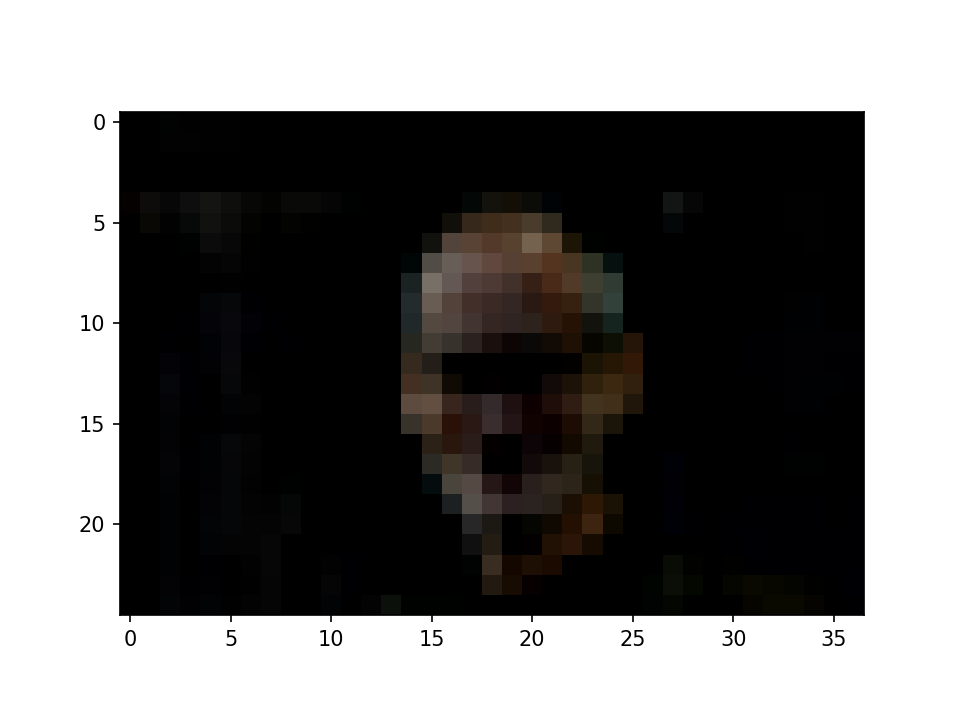

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<IPython.core.display.Javascript object>


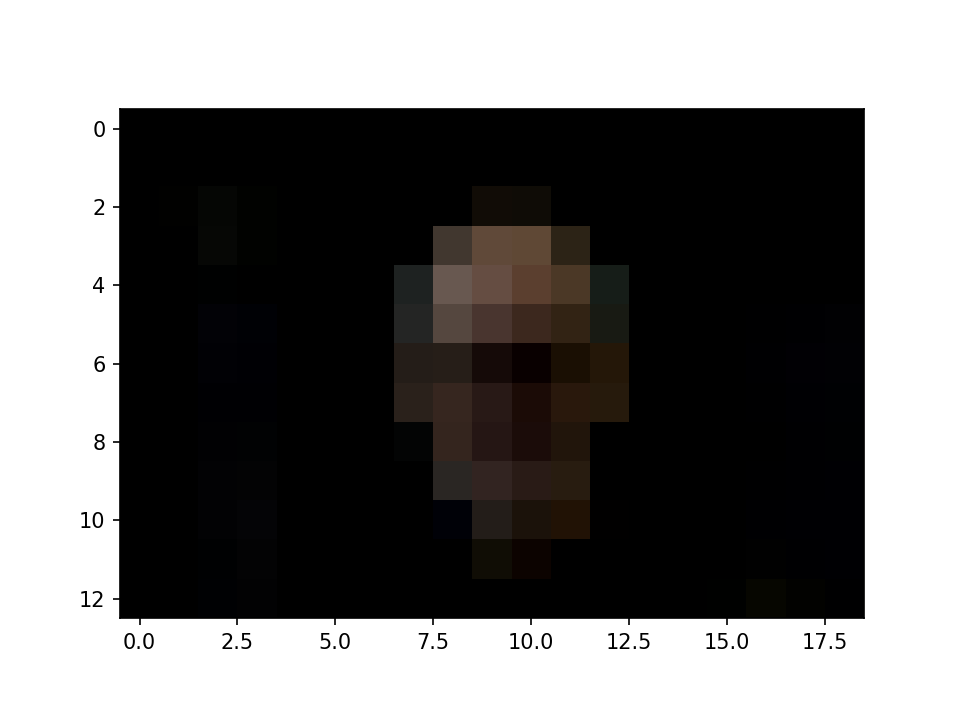

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


"\nplt.figure()\n# Create a Gaussian Pyramid\ngaussian_pyr = [lower]\nfor i in range(3):\n    lower = cv2.pyrDown(lower)\n    gaussian_pyr.append(lower)\n \n# Last level of Gaussian remains same in Laplacian\nlaplacian_top = gaussian_pyr[-1]\n \nplt.figure()\n# Create a Laplacian Pyramid\nlaplacian_pyr = [laplacian_top]\nfor i in range(3,0,-1):\n    size = (gaussian_pyr[i - 1].shape[1], gaussian_pyr[i - 1].shape[0])\n    gaussian_expanded = cv2.pyrUp(gaussian_pyr[i], dstsize=size)\n    laplacian = cv2.subtract(gaussian_pyr[i-1], gaussian_expanded)\n    laplacian_pyr.append(laplacian)\n    #cv2.imshow('lap-{}'.format(i-1),laplacian)\n    #cv2.waitKey(0)\n\nfor i in laplacian_pyr:\n    plt.figure()\n    plt.imshow(i)\n"

In [75]:
lower = im_hybrid.copy()
L = cv2.GaussianBlur(lower, (601, 601), 100, cv2.BORDER_REPLICATE)
L = lower - L
plt.figure()
plt.imshow(L)
lower = cv2.pyrDown(lower)
L = cv2.GaussianBlur(lower, (301, 301), 50, cv2.BORDER_REPLICATE)
L = lower - L
plt.figure()
plt.imshow(L)
lower = cv2.pyrDown(lower)
L = cv2.GaussianBlur(lower, (151, 151), 25, cv2.BORDER_REPLICATE)
L = lower - L
plt.figure()
plt.imshow(L)
lower = cv2.pyrDown(lower)
L = cv2.GaussianBlur(lower, (67, 67), 11, cv2.BORDER_REPLICATE)
L = lower - L
plt.figure()
plt.imshow(L)
lower = cv2.pyrDown(lower)
L = cv2.GaussianBlur(lower, (11, 11), 5, cv2.BORDER_REPLICATE)
L = lower - L
plt.figure()
plt.imshow(L)
lower = cv2.pyrDown(lower)
L = cv2.GaussianBlur(lower, (7, 7), 3, cv2.BORDER_REPLICATE)
L = lower - L
plt.figure()
plt.imshow(L)

'''
plt.figure()
# Create a Gaussian Pyramid
gaussian_pyr = [lower]
for i in range(3):
    lower = cv2.pyrDown(lower)
    gaussian_pyr.append(lower)
 
# Last level of Gaussian remains same in Laplacian
laplacian_top = gaussian_pyr[-1]
 
plt.figure()
# Create a Laplacian Pyramid
laplacian_pyr = [laplacian_top]
for i in range(3,0,-1):
    size = (gaussian_pyr[i - 1].shape[1], gaussian_pyr[i - 1].shape[0])
    gaussian_expanded = cv2.pyrUp(gaussian_pyr[i], dstsize=size)
    laplacian = cv2.subtract(gaussian_pyr[i-1], gaussian_expanded)
    laplacian_pyr.append(laplacian)
    #cv2.imshow('lap-{}'.format(i-1),laplacian)
    #cv2.waitKey(0)

for i in laplacian_pyr:
    plt.figure()
    plt.imshow(i)
'''